# Minor project 
## Submitted by:
## Paras
### https://github.com/paras3849

### Objective

#### Perform Ensemble Learning  Algorithm on Diabetes dataset

Load & check the data:

Pregnancies - Number of times pregnant

Glucose - Plasma glucose concentration

BloodPressure - Diastolic blood pressure (mm Hg)

SkinThickness - Triceps skin fold thickness (mm)

Insulin - 2-Hour serum insulin (mu U/ml)

BMI - Body mass index

DiabetesPedigreeFunction - Diabetes pedigree function

Age - Age (years)

Outcome - Class variable (0 or 1) - (Target variable)

In [1]:
# Importing All Libraries 
import pandas as pd
import numpy as np
import time
import joblib
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas_profiling
from matplotlib.colors import ListedColormap

import seaborn as sns
from seaborn import pairplot, heatmap
from scipy import stats
from scipy import stats, special
from scipy.stats import skewtest, kurtosistest, normaltest, norm
from scipy.stats import mode

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.utils import check_random_state
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.naive_bayes import MultinomialNB
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, BaggingClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.datasets import make_classification
from sklearn import svm, model_selection, metrics, linear_model
from sklearn.svm import SVC 
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix, accuracy_score , classification_report
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

C:\Users\PARAS\AppData\Local\Temp\ipykernel_28520\1125426270.py:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


### Loading the data

In [2]:
data = pd.read_csv('D:\Project Ekeeda\Diabetic.csv')

### Data Exploration

In [3]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

#### Looking for null data and duplicated rows

In [6]:
data.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [7]:
data.duplicated().sum()

0

#### Looking for outliers

<AxesSubplot:xlabel='Age'>

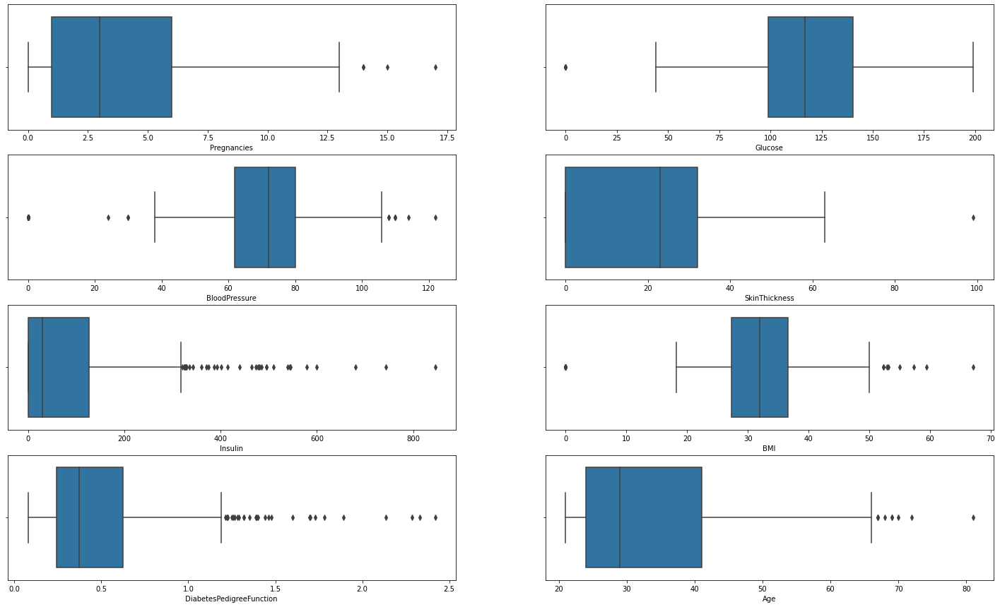

In [8]:
fig,axs = plt.subplots(4,2, figsize = (25,15))

sns.boxplot(data=data, x="Pregnancies", ax=axs[0, 0], hue='Outcome')
sns.boxplot(data=data, x="Glucose", ax=axs[0, 1], hue='Outcome')
sns.boxplot(data=data, x="BloodPressure", ax=axs[1, 0], hue='Outcome')
sns.boxplot(data=data, x="SkinThickness", ax=axs[1, 1], hue='Outcome')
sns.boxplot(data=data, x="Insulin", ax=axs[2, 0], hue='Outcome')
sns.boxplot(data=data, x="BMI", ax=axs[2, 1], hue='Outcome')
sns.boxplot(data=data, x="DiabetesPedigreeFunction", ax=axs[3, 0], hue='Outcome')
sns.boxplot(data=data, x="Age", ax=axs[3, 1], hue='Outcome')

In [9]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [10]:
def get_outliers(data, col, detection="mild", method="IQR", position="both"):
    Q1, Q3= data[col].quantile(0.25), data[col].quantile(0.75)
    IQR = Q3 - Q1
    k = 1.5
    
    df_mean, df_std = data[col].mean(), data[col].std()
    n = 3
    
    if detection == "extreme":
        k = 3
        n = 4
    
    if method == "IQR":
        upper, lower = Q3 + IQR*k, Q1 - IQR*k
    else:
        upper, lower = df_std * n + df_mean, df_std * n - df_mean
        
    
    if position == "lower":
        mask = (data[col] <= lower)
    elif position == "upper":
        mask = (data[col] >= upper)
    else:
        mask = (data[col] <= lower) | (data[col] >= upper)
        
    return data[mask]

def table_outliers(data, columns, target="Outcome", alpha=0.05):
    df_olr = pd.DataFrame(columns=["Feature", "Normal Distribution", "P-value", "Skewness", "Kurtosis", "Detection method", "Mild Outliers", "Extreme Outliers"])
    
    for col in columns:
        skew, kurt = skewtest(data[col]), kurtosistest(data[col])
        stats, pvalue = normaltest(data[col])
        normality = False
        
        if pvalue > alpha:
            normality = True
            
        if normality == True and skew[1] > alpha:
            method = "STD"
            mild_out = get_outliers(data, col, "mild", "STD")
            extreme_out = get_outliers(data, col, "extreme", "STD")
        else:
            method = "IQR"
            mild_out = get_outliers(data, col, "mild", "IQR")
            extreme_out = get_outliers(data, col, "extreme", "IQR")
            
        df_new = pd.DataFrame(data={"Feature":[col],
                                    "Normal Distribution":[normality],
                                    "P-value": [pvalue],
                                    "Skewness":[skew[0]],
                                    "Kurtosis":[kurt[0]],
                                    "Detection method":[method],
                                    "Mild Outliers":[len(mild_out) - len(extreme_out)],
                                    "Extreme Outliers":[len(extreme_out)],
                                    "Percentage of outliers":[(len(mild_out))*100/len(data)]
                                   }
                             )
        df_olr = pd.concat((df_olr, df_new), axis=0, ignore_index = True)
    return df_olr

outliers = table_outliers(data, ["SkinThickness", "Glucose", "Age", "Pregnancies", "BMI", "DiabetesPedigreeFunction", "Insulin", "BloodPressure"], "Outcome", 0.05).sort_values(["Extreme Outliers", "Mild Outliers"], ascending=[False, False])
outliers

,Feature,Normal Distribution,P-value,Skewness,Kurtosis,Detection method,Mild Outliers,Extreme Outliers,Percentage of outliers
7,BloodPressure,False,0.0,-14.555871,9.696056,IQR,10,35,5.859375
6,Insulin,False,0.0,16.388118,10.909049,IQR,25,9,4.427083
5,DiabetesPedigreeFunction,False,0.0,14.906939,9.981094,IQR,23,6,3.776042
4,BMI,False,0.0,-4.695064,8.006176,IQR,18,1,2.473958
2,Age,False,0.0,10.55044,2.926748,IQR,9,0,1.171875
1,Glucose,False,0.002045,1.966493,2.918555,IQR,5,0,0.651042
3,Pregnancies,False,0.0,8.904638,0.933391,IQR,4,0,0.520833
0,SkinThickness,False,0.000171,1.243197,-3.974837,IQR,1,0,0.130208


In [11]:
def get_normal_number(n, x0):
    x = np.arange(-x0, x0+1)
    xU, xL = x + 0.5, x - 0.5 
    prob = norm.cdf(xU, scale = np.std(x)) - norm.cdf(xL, scale = np.std(x))
    prob = prob / prob.sum()
    return np.abs(np.random.choice(x, size=n, p = prob))

def replace_outliers(data, columns, methods):
    df_ = data.copy()
    for col, mtd in zip(columns, methods):
        mild_upper = get_outliers(data=df_, col=col, method=mtd, detection="mild", position="upper")
        mild_lower = get_outliers(data=df_, col=col, method=mtd, detection="mild", position="lower")
        mild = get_outliers(data=df_, col=col, method=mtd, detection="mild")
        mean = df_[~df_.isin(mild)][col].mean()
        
        df_.loc[mild_upper.index.values, col] = mean + (get_normal_number(len(mild_upper), 20) if mean > 20 else 0)
        df_.loc[mild_lower.index.values, col] = mean - (get_normal_number(len(mild_lower), 20) if mean > 20 else 0)
        
    return df_

columns_outliers = outliers[outliers["Percentage of outliers"] > 1].Feature.values
methods = outliers[outliers["Percentage of outliers"] > 1]["Detection method"].values
data = replace_outliers(data, columns_outliers, methods)
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000000,1.00000,3.0000,6.00000,17.000
Glucose,768.0,120.894531,31.972618,0.000000,99.00000,117.0000,140.25000,199.000
BloodPressure,768.0,71.837758,11.443797,38.000000,64.00000,72.0000,80.00000,106.000
SkinThickness,768.0,20.536458,15.952218,0.000000,0.00000,23.0000,32.00000,99.000
Insulin,768.0,62.646046,77.378768,0.000000,0.00000,30.5000,110.00000,318.000
BMI,768.0,32.163641,6.556050,14.204005,27.40000,32.0000,36.50000,50.000
DiabetesPedigreeFunction,768.0,0.429832,0.244918,0.078000,0.24375,0.3725,0.58225,1.191
Age,768.0,32.880527,11.075700,21.000000,24.00000,29.0000,40.00000,66.000
Outcome,768.0,0.348958,0.476951,0.000000,0.00000,0.0000,1.00000,1.000


In [12]:
data.shape

(768, 9)

In [13]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,71.837758,20.536458,62.646046,32.163641,0.429832,32.880527,0.348958
std,3.369578,31.972618,11.443797,15.952218,77.378768,6.556050,0.244918,11.075700,0.476951
min,0.000000,0.000000,38.000000,0.000000,0.000000,14.204005,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,0.000000,0.000000,27.400000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,110.000000,36.500000,0.582250,40.000000,1.000000
max,17.000000,199.000000,106.000000,99.000000,318.000000,50.000000,1.191000,66.000000,1.000000


In [14]:
data.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                64
SkinThickness                51
Insulin                     172
BMI                         256
DiabetesPedigreeFunction    490
Age                          51
Outcome                       2
dtype: int64

In [15]:
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='Outcome', ylabel='count'>

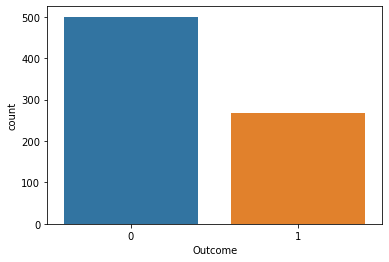

In [16]:
sns.countplot(x="Outcome",data=data)

### Data Correlation

In [17]:
data.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.194886,-0.081672,-0.094829,0.026872,0.002189,0.564302,0.221898
Glucose,0.129459,1.000000,0.207309,0.057328,0.214719,0.226722,0.086331,0.270987,0.466581
BloodPressure,0.194886,0.207309,1.000000,0.068837,-0.021587,0.291025,0.030857,0.340206,0.157861
SkinThickness,-0.081672,0.057328,0.068837,1.000000,0.479068,0.390271,0.157864,-0.094245,0.074752
Insulin,-0.094829,0.214719,-0.021587,0.479068,1.000000,0.186499,0.205089,-0.078259,0.088533
BMI,0.026872,0.226722,0.291025,0.390271,0.186499,1.000000,0.133818,0.071690,0.306910
DiabetesPedigreeFunction,0.002189,0.086331,0.030857,0.157864,0.205089,0.133818,1.000000,0.042136,0.156548
Age,0.564302,0.270987,0.340206,-0.094245,-0.078259,0.071690,0.042136,1.000000,0.261278
Outcome,0.221898,0.466581,0.157861,0.074752,0.088533,0.306910,0.156548,0.261278,1.000000


In [18]:
def plot_corr(df, size=11):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)

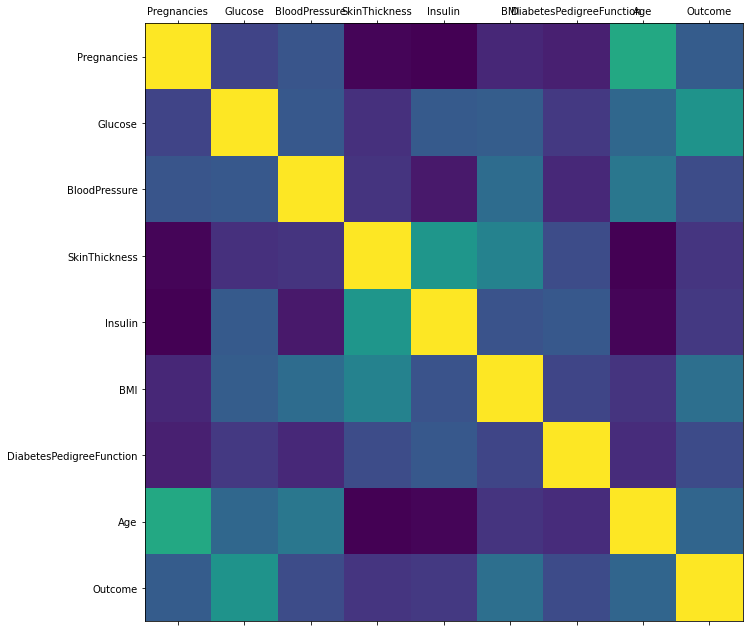

In [19]:
plot_corr(data)

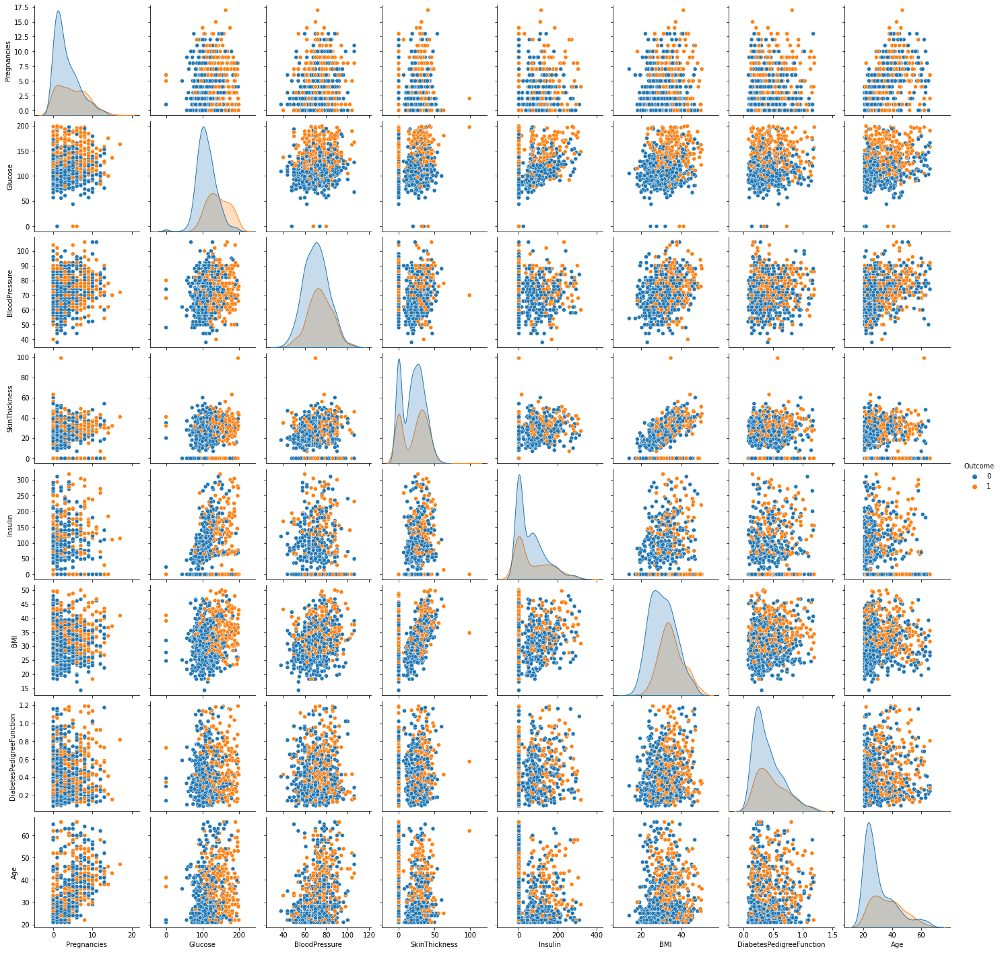

In [20]:
sns.pairplot(data,hue='Outcome')

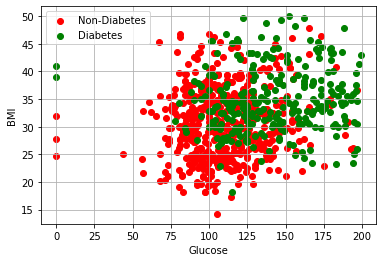

In [21]:
diabetic_negtive=data[data.Outcome == 0]
diabetic_positive=data[data.Outcome == 1]
plt.scatter(diabetic_negtive['Glucose'],diabetic_negtive['BMI'],color='r')
plt.scatter(diabetic_positive['Glucose'],diabetic_positive['BMI'],color='g')
plt.xlabel("Glucose")
plt.ylabel("BMI")
plt.legend(('Non-Diabetes','Diabetes'))
plt.grid()

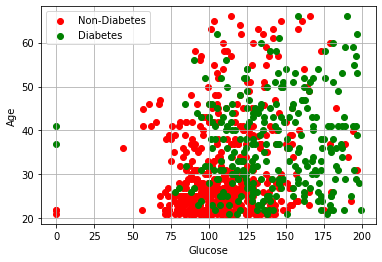

In [22]:
plt.scatter(diabetic_negtive['Glucose'],diabetic_negtive['Age'],color='r')
plt.scatter(diabetic_positive['Glucose'],diabetic_positive['Age'],color='g')
plt.xlabel("Glucose")
plt.ylabel("Age")
plt.legend(('Non-Diabetes','Diabetes'))
plt.grid()

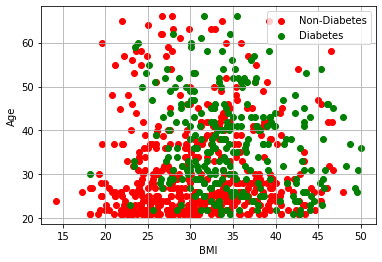

In [23]:
plt.scatter(diabetic_negtive['BMI'],diabetic_negtive['Age'],color='r')
plt.scatter(diabetic_positive['BMI'],diabetic_positive['Age'],color='g')
plt.xlabel("BMI")
plt.ylabel("Age")
plt.legend(('Non-Diabetes','Diabetes'))
plt.grid()

In [24]:
data.groupby('Outcome').size()

Outcome
0    500
1    268
dtype: int64

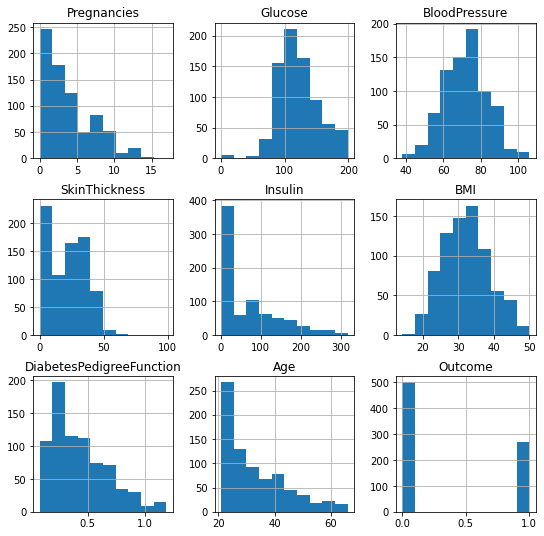

In [25]:
x=data.hist(figsize=(9, 9))

Outcome
0    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
1    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
dtype: object

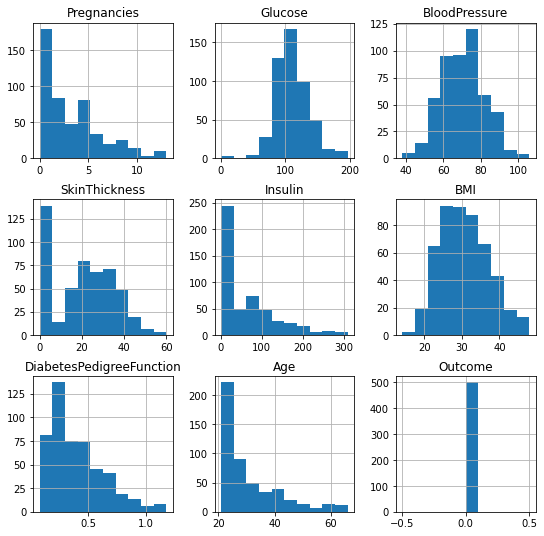

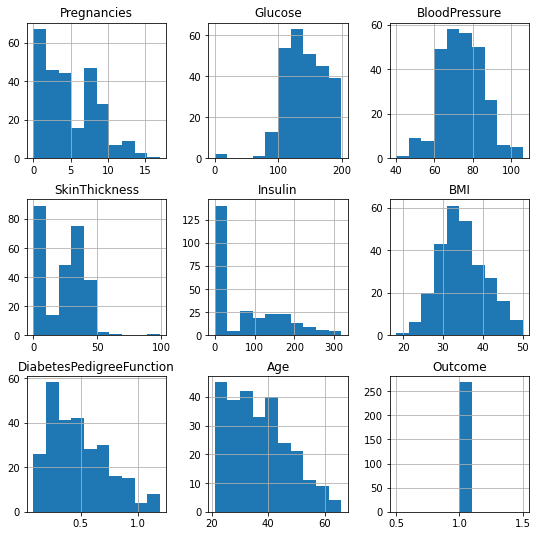

In [26]:
data.groupby('Outcome').hist(figsize=(9, 9))

In [27]:
feature_columns = [
    'Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 
    'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'
]

In [28]:
X = data[feature_columns]
Y = data.Outcome
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72.0,35,0.0,33.6,0.627000,50.0,1
1,1,85,66.0,29,0.0,26.6,0.351000,31.0,0
2,8,183,64.0,0,0.0,23.3,0.672000,32.0,1
3,1,89,66.0,23,94.0,28.1,0.167000,21.0,0
4,0,137,40.0,35,168.0,43.1,0.429832,33.0,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76.0,48,180.0,32.9,0.171000,63.0,0
764,2,122,70.0,27,0.0,36.8,0.340000,27.0,0
765,5,121,72.0,23,112.0,26.2,0.245000,30.0,0
766,1,126,60.0,0,0.0,30.1,0.349000,47.0,1


### Splitting the dataset into the Training set and Test set

In [29]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state = 0)

In [30]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
580,0,151,90.0,46,0.0,42.100000,0.371,21.000000
418,1,83,68.0,0,0.0,18.200000,0.624,27.000000
764,2,122,70.0,27,0.0,36.800000,0.340,27.000000
363,4,146,78.0,0,0.0,38.500000,0.520,36.805007
757,0,123,72.0,0,0.0,36.300000,0.258,52.000000
...,...,...,...,...,...,...,...,...
763,10,101,76.0,48,180.0,32.900000,0.171,63.000000
192,7,159,66.0,0,0.0,30.400000,0.383,36.000000
629,4,94,65.0,22,0.0,24.700000,0.148,21.000000
559,11,85,74.0,0,0.0,30.100000,0.300,35.000000


In [31]:
Y_train

580    1
418    0
764    0
363    1
757    1
      ..
763    0
192    1
629    0
559    0
684    0
Name: Outcome, Length: 537, dtype: int64

In [32]:
X_test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
661,1,199,76.0,43,0.0,42.9,0.429832,22.0
122,2,107,74.0,30,100.0,33.6,0.404000,23.0
113,4,76,62.0,0,0.0,34.0,0.391000,25.0
14,5,166,72.0,19,175.0,25.8,0.587000,51.0
529,0,111,65.0,0,0.0,24.6,0.660000,31.0
...,...,...,...,...,...,...,...,...
165,6,104,74.0,18,156.0,29.9,0.722000,41.0
188,8,109,76.0,39,114.0,27.9,0.640000,31.0
334,1,95,60.0,18,58.0,23.9,0.260000,22.0
758,1,106,76.0,0,0.0,37.5,0.197000,26.0


In [33]:
Y_test

661    1
122    0
113    0
14     1
529    0
      ..
165    1
188    1
334    0
758    0
34     0
Name: Outcome, Length: 231, dtype: int64

### Feature Scaling

In [34]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [35]:
X_train

array([[-1.13311543,  0.9144385 ,  1.54528848, ...,  1.46303525,
        -0.23825532, -1.10113773],
       [-0.8391623 , -1.19655127, -0.37953506, ..., -2.16114147,
         0.80455828, -0.55759053],
       [-0.54520916,  0.01416345, -0.2045511 , ...,  0.65934752,
        -0.3660309 , -0.55759053],
       ...,
       [ 0.0426971 , -0.85506763, -0.642011  , ..., -1.17548671,
        -1.15741514, -1.10113773],
       [ 2.10036903, -1.13446334,  0.14541682, ..., -0.35663507,
        -0.53090262,  0.16713907],
       [ 0.33665024,  0.44877899,  0.84535265, ..., -0.0375854 ,
         0.87050697,  1.14597757]])

In [36]:
X_test

array([[-0.8391623 ,  2.40454892,  0.32040077, ...,  1.5843466 ,
         0.00423885, -1.01054653],
       [-0.54520916, -0.45149606,  0.14541682, ...,  0.17410211,
        -0.10223615, -0.91995533],
       [ 0.0426971 , -1.41385904, -0.90448694, ...,  0.23475778,
        -0.15581946, -0.73877293],
       ...,
       [-0.8391623 , -0.82402367, -1.07947089, ..., -1.29679807,
        -0.69577433, -1.01054653],
       [-0.8391623 , -0.48254003,  0.32040077, ...,  0.76549496,
        -0.95544728, -0.64818173],
       [ 1.8064159 ,  0.01416345,  0.49538473, ..., -0.73573305,
         0.34291748,  1.07305106]])

In [37]:
def evaluate(model, X_train, X_test, Y_train, Y_test):
    Y_test_pred = model.predict(X_test)
    Y_train_pred = model.predict(X_train)

    print("TRAINIG RESULTS: \n===============================")
    clf_report = pd.DataFrame(classification_report(Y_train, Y_train_pred, output_dict=True))
    print(f"CONFUSION MATRIX:\n{confusion_matrix(Y_train, Y_train_pred)}")
    print(f"ACCURACY SCORE:\n{accuracy_score(Y_train, Y_train_pred):.4f}")
    print(f"CLASSIFICATION REPORT:\n{clf_report}")

    print("TESTING RESULTS: \n===============================")
    clf_report = pd.DataFrame(classification_report(Y_test, Y_test_pred, output_dict=True))
    print(f"CONFUSION MATRIX:\n{confusion_matrix(Y_test, Y_test_pred)}")
    print(f"ACCURACY SCORE:\n{accuracy_score(Y_test, Y_test_pred):.4f}")
    print(f"CLASSIFICATION REPORT:\n{clf_report}")

## Bagging Algorithms

The three bagging models:

1. Bagged Decision Trees
2. Random Forest
3. Extra Trees

#### Bagged Decision Trees

In [38]:
tree = DecisionTreeClassifier()
bagging_clf = BaggingClassifier(base_estimator=tree, n_estimators=1500, random_state=42)
bagging_clf.fit(X_train, Y_train)

evaluate(bagging_clf, X_train, X_test, Y_train, Y_test)


TRAINIG RESULTS: 
CONFUSION MATRIX:
[[343   0]
 [  0 194]]
ACCURACY SCORE:
1.0000
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    343.0  194.0       1.0      537.0         537.0
TESTING RESULTS: 
CONFUSION MATRIX:
[[136  21]
 [ 30  44]]
ACCURACY SCORE:
0.7792
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.819277   0.676923  0.779221    0.748100      0.773675
recall       0.866242   0.594595  0.779221    0.730418      0.779221
f1-score     0.842105   0.633094  0.779221    0.737599      0.775149
support    157.000000  74.000000  0.779221  231.000000    231.000000


In [39]:
scores = {
    'Bagging Classifier': {
        'Train': accuracy_score(Y_train, bagging_clf.predict(X_train)),
        'Test': accuracy_score(Y_test, bagging_clf.predict(X_test)),
    },
}

#### Random Forest

In [40]:
rf_clf = RandomForestClassifier(random_state=42, n_estimators=1000)
rf_clf.fit(X_train, Y_train)
evaluate(rf_clf, X_train, X_test, Y_train, Y_test)

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[343   0]
 [  0 194]]
ACCURACY SCORE:
1.0000
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    343.0  194.0       1.0      537.0         537.0
TESTING RESULTS: 
CONFUSION MATRIX:
[[137  20]
 [ 34  40]]
ACCURACY SCORE:
0.7662
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.801170   0.666667  0.766234    0.733918      0.758082
recall       0.872611   0.540541  0.766234    0.706576      0.766234
f1-score     0.835366   0.597015  0.766234    0.716190      0.759011
support    157.000000  74.000000  0.766234  231.000000    231.000000


In [41]:
scores['Random Forest'] = {
        'Train': accuracy_score(Y_train, rf_clf.predict(X_train)),
        'Test': accuracy_score(Y_test, rf_clf.predict(X_test)),
    }

#### Extra Trees

In [42]:
ex_tree_clf = ExtraTreesClassifier(n_estimators=1000, max_features=7, random_state=42)
ex_tree_clf.fit(X_train, Y_train)
evaluate(ex_tree_clf, X_train, X_test, Y_train, Y_test)

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[343   0]
 [  0 194]]
ACCURACY SCORE:
1.0000
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    343.0  194.0       1.0      537.0         537.0
TESTING RESULTS: 
CONFUSION MATRIX:
[[137  20]
 [ 31  43]]
ACCURACY SCORE:
0.7792
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.815476   0.682540  0.779221    0.749008      0.772890
recall       0.872611   0.581081  0.779221    0.726846      0.779221
f1-score     0.843077   0.627737  0.779221    0.735407      0.774094
support    157.000000  74.000000  0.779221  231.000000    231.000000


In [43]:
scores['Extra Tree'] = {
        'Train': accuracy_score(Y_train, ex_tree_clf.predict(X_train)),
        'Test': accuracy_score(Y_test, ex_tree_clf.predict(X_test)),
    }

## Boosting Algorithms

The two most common boosting ensemble machine learning algorithms are:

1. AdaBoost
2. Stochastic Gradient Boosting


#### AdaBoost

In [44]:
ada_boost_clf = AdaBoostClassifier(n_estimators=30)
ada_boost_clf.fit(X_train, Y_train)
evaluate(ada_boost_clf, X_train, X_test, Y_train, Y_test)

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[302  41]
 [ 52 142]]
ACCURACY SCORE:
0.8268
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.853107    0.775956  0.826816    0.814532      0.825235
recall       0.880466    0.731959  0.826816    0.806213      0.826816
f1-score     0.866571    0.753316  0.826816    0.809943      0.825656
support    343.000000  194.000000  0.826816  537.000000    537.000000
TESTING RESULTS: 
CONFUSION MATRIX:
[[130  27]
 [ 44  30]]
ACCURACY SCORE:
0.6926
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.747126   0.526316  0.692641    0.636721      0.676391
recall       0.828025   0.405405  0.692641    0.616715      0.692641
f1-score     0.785498   0.458015  0.692641    0.621757      0.680590
support    157.000000  74.000000  0.692641  231.000000    231.000000


In [45]:
scores['AdaBoost'] = {
        'Train': accuracy_score(Y_train, ada_boost_clf.predict(X_train)),
        'Test': accuracy_score(Y_test, ada_boost_clf.predict(X_test)),
    }

#### Stochastic Gradient Boosting

In [46]:
grad_boost_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
grad_boost_clf.fit(X_train, Y_train)
evaluate(grad_boost_clf, X_train, X_test, Y_train, Y_test)

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[333  10]
 [ 30 164]]
ACCURACY SCORE:
0.9255
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.917355    0.942529  0.925512    0.929942      0.926450
recall       0.970845    0.845361  0.925512    0.908103      0.925512
f1-score     0.943343    0.891304  0.925512    0.917324      0.924543
support    343.000000  194.000000  0.925512  537.000000    537.000000
TESTING RESULTS: 
CONFUSION MATRIX:
[[135  22]
 [ 35  39]]
ACCURACY SCORE:
0.7532
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.794118   0.639344  0.753247    0.716731      0.744537
recall       0.859873   0.527027  0.753247    0.693450      0.753247
f1-score     0.825688   0.577778  0.753247    0.701733      0.746271
support    157.000000  74.000000  0.753247  231.000000    231.000000


In [47]:
scores['Gradient Boosting'] = {
        'Train': accuracy_score(Y_train, grad_boost_clf.predict(X_train)),
        'Test': accuracy_score(Y_test, grad_boost_clf.predict(X_test)),
    }

## Voting Ensemble

In [48]:
estimators = []
log_reg = LogisticRegression(solver='liblinear')
estimators.append(('Logistic', log_reg))

tree = DecisionTreeClassifier()
estimators.append(('Tree', tree))

svm_clf = SVC(gamma='scale')
estimators.append(('SVM', svm_clf))

voting = VotingClassifier(estimators=estimators)
voting.fit(X_train, Y_train)

evaluate(voting, X_train, X_test, Y_train, Y_test)

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[315  28]
 [ 60 134]]
ACCURACY SCORE:
0.8361
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.840000    0.827160  0.836127    0.833580      0.835362
recall       0.918367    0.690722  0.836127    0.804544      0.836127
f1-score     0.877437    0.752809  0.836127    0.815123      0.832413
support    343.000000  194.000000  0.836127  537.000000    537.000000
TESTING RESULTS: 
CONFUSION MATRIX:
[[140  17]
 [ 38  36]]
ACCURACY SCORE:
0.7619
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.786517   0.679245  0.761905    0.732881      0.752153
recall       0.891720   0.486486  0.761905    0.689103      0.761905
f1-score     0.835821   0.566929  0.761905    0.701375      0.749682
support    157.000000  74.000000  0.761905  231.000000    231.000000


In [49]:
scores['Voting'] = {
        'Train': accuracy_score(Y_train, voting.predict(X_train)),
        'Test': accuracy_score(Y_test, voting.predict(X_test)),
    }


## Model Comparison

<AxesSubplot:>

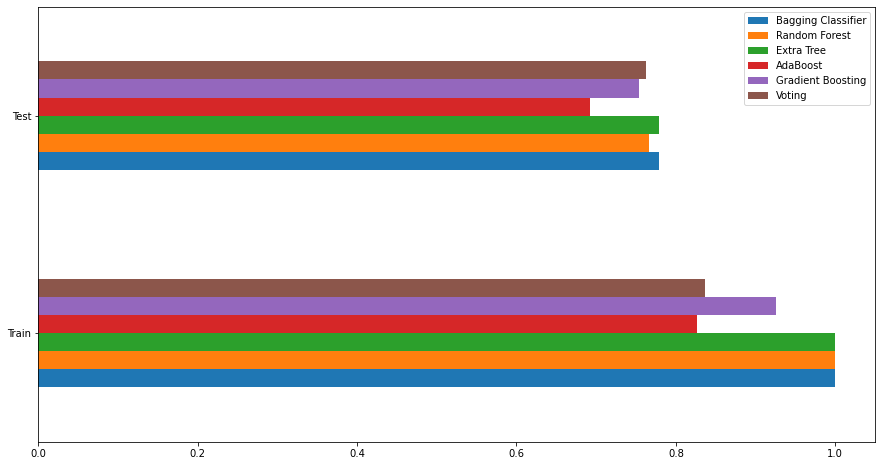

In [50]:
scores_df = pd.DataFrame(scores)

scores_df.plot(kind='barh', figsize=(15, 8))
